In [1]:
"""
    This project is an implementation of Harris corner dector including descriptors generation and matching process, which is di-
vided into six stages as following.
    The first stage is to pre-process the image using laplacian operator to sharpen the image so that the potential harris corner
point is more obvious. The next stage is generating the second-order moment matrix M of graylevel function so that Harris respon-
se value can be computed. Since the response value of every pixel in the image are gotten, it should be compared with a threshold
to see if this pixel is corner point. Also, a non-extrema suppression is needed to remove some error points.
    Since all the corner point are obtained, to achieve a matching purpose, it is necessary to generate a descriptor which is the
neighborhood of each one. So far we have gotten the harris descriptors of one image, using the same process as above to get the
harris corner points as well as their corresponding descriptors of the other image. Then we can use NCC method to do the matching
job so that object of one image can be detected from the other one. 
    
"""
import cv2
import copy
import numpy as np
from matplotlib import pyplot as plt
 
def harris(gray):
    img_laplace = cv2.Laplacian(gray, cv2.CV_32F, ksize=3)#pre-process the image to make the conrner point obvious  
#    dx = np.array(grad_x(img_laplace))
#    dy = np.array(grad_y(img_laplace))
    dx=cv2.Sobel(img_laplace,-1,1,0)#calculate the gradient of image be processed along x-axis
    dy=cv2.Sobel(img_laplace,-1,0,1)#calculate the gradient of image be processed along y-axis
        
    A = cv2.GaussianBlur(dx*dx,(3,3),2)#compute other elements needed to form a second-order moment matrix M, weighted by gaussian function
    B = cv2.GaussianBlur(dy*dy,(3,3),2)
    C = cv2.GaussianBlur(dx*dy,(3,3),2)
        
    a = int(gray.shape[0])
    b = int(gray.shape[1])    
    R = np.zeros(gray.shape)
    record= np.zeros(gray.shape)
    
    for i in range(a):#for all the pixel in the image
        for j in range(b):
            M = [[A[i,j],C[i,j]],[C[i,j],B[i,j]]]    #second-order moment matrix
            R[i,j] = np.linalg.det(M) - 0.05 * (np.trace(M)) * (np.trace(M))#compute response value by calculating the difference between determinant and trace
    R_max=np.max(R)# maximum response value
    for i in range(1,a-1):
        for j in range(1,b-1):
#            if R[i,j]>=0.01*R_max :
#                record[i,j]=255
            if R[i,j]>=0.01*R_max and R[i,j]==np.max(R[i-1:i+2, j-1:j+2]):#use a threshold to control the number of corner point,with non-extrema suppression
                record[i,j]=255#record the pixel as 255,otherwise 0

    return record

def plot_points(image,record):
    """ Plots corners found in image. """
    res=image.copy()
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if record[i,j]>0:
                res[i-1:i+2,j-1:j+2]=[255,0,0]#to make the point clear to be observed, print the red color in its neighbouring area
    return res
                


def get_descriptors(image,filtered_coords,wid=5):
    """ For each point return pixel values around the point
        using a neighbourhood of width 2*wid+1. (Assume points are 
        extracted with min_distance > wid). """
   
    desc = []#creat a list for the space of descriptor
    for i in range(len(filtered_coords[0])):#get the coordinates of every corner point
        y=filtered_coords[0][i]
        x=filtered_coords[1][i]
        if x-wid>=0 and x+wid<image.shape[1] and y-wid>=0 and y+wid<image.shape[0]:#sample the neighourhood as a descriptor if the neighbourhood is within the image.
            patch = image[int(y-wid):int(y+wid+1),int(x-wid):int(x+wid+1)]
            desc.append(patch)

    return desc

def match(desc1,desc2,threshold=0.5):
    """ For each corner point descriptor in the first image, 
        select its match to second image using
        normalized cross correlation. """

    n = len(desc1[0])
    # pair-wise distances
    d = -np.ones((len(desc1),len(desc2)))
    for i in range(len(desc1)):
        for j in range(len(desc2)):#for all the descriptors in two images ,using NCC method to judge whether the two points are matched or not
            d1 = (desc1[i] - np.mean(desc1[i])) / np.std(desc1[i])
            d2 = (desc2[j] - np.mean(desc2[j])) / np.std(desc2[j])
            ncc_value = np.sum(d1 * d2) / (n-1) 
            if ncc_value > threshold:
                d[i,j] = ncc_value

    ndx = np.argsort(-d)##reorder every row(fixed i)(element in the descriptor main image) in descending order of d,which means the number of column with highest ncc_value will be set as the first one
    matchscores = ndx[:,0]#for every i select j with the highest ncc value,which means select the element the most likely to be matched of descriptor in matching image 

    return matchscores

def match_twosided(desc1,desc2,threshold=0.5):
    """ Two-sided symmetric version of match(). """

    matches_12 = match(desc1,desc2,threshold)
    matches_21 = match(desc2,desc1,threshold)

    ndx_12 = np.where(matches_12 >= 0)[0]

    # remove matches that are not symmetric
    for n in ndx_12:
        if matches_21[matches_12[n]] != n:
            matches_12[n] = -1

    return matches_12
def appendimages(im1, im2):
    """返回将两幅图像并排拼接成的一幅新图像"""
    #选取具有最少行数的图像，然后填充足够的空行
    rows1 = im1.shape[0]
    rows2 = im2.shape[0]

    if rows1 < rows2:#select the image with smaller row and pad it 
        im1 = np.concatenate((im1, np.zeros((rows2-rows1,im1.shape[1]))),axis=0)
    elif rows1 >rows2:
        im2 = np.concatenate((im2, np.zeros((rows1-rows2,im2.shape[1]))),axis=0)
    return np.concatenate((im1,im2), axis=1)

def plot_matches(im1,im2,locs1,locs2,matchscores,show_below=True):
    """ 显示一幅带有连接匹配之间连线的图片
        输入：im1, im2(数组图像), locs1,locs2（特征位置）,matchscores(match()的输出)，
        show_below（如果图像应该显示在匹配的下方）
    """
    im3=appendimages(im1,im2)
    if show_below:
        im3=np.vstack((im3,im3))#form the image so that the final result is on the higher-half part, the original image is on the lower-half part.

 
    cols1 = im1.shape[1]
    plt.imshow(im3,cmap='gray')
    for i in range(len(matchscores)):
        if matchscores[i]>0:#for i=0 ,if matchscores[i]==0, two point are overlapping with each other
            x1=int(locs1[1][i])#for every corner point
            y1=int(locs1[0][i])
            x2=int(locs2[1][matchscores[i]]+cols1)#extract the coordinate of corresponding matching point 
            y2=int(locs2[0][matchscores[i]])
#            cv2.line(im3,(x1,y1),(x2,y2),(np.random.randint(256),np.random.randint(256),np.random.randint(256)),1) 
#            cv2.line(im3,(locs1[i,0],locs1[i,1]),(locs2[matchscores[i,0],0]+cols1,locs2[matchscores[i,0],1]),(255,255,100),3) 
            plt.plot((x1,x2),(y1,y2),'c')#plot the line between them
#    plt.imshow(im3,cmap='gray')
 
    return 

wid = 5#the width of neighborhood of corner points
pic1 = cv2.imread('imdata\\notebook1.jpg')
#pic1 = cv2.imread('imdata\\hands11.jpg')
gray1 = cv2.cvtColor(pic1, cv2.COLOR_RGB2GRAY)
gray1 = np.float32(gray1)
cp1plot=harris(gray1)
cp1=np.where(cp1plot>0)
d1 = get_descriptors(gray1, cp1, wid)

pic2 = cv2.imread('imdata\\notebook1c.jpg')
#pic2 = cv2.imread('imdata\\hands12.jpg')
gray2 = cv2.cvtColor(pic2, cv2.COLOR_RGB2GRAY)
gray2 = np.float32(gray2)
cp2plot=harris(gray2)
cp2=np.where(cp2plot>0)
d2 = get_descriptors(gray2, cp2, wid)

pic3 = cv2.imread('imdata\\notebook13.jpg')
gray3 = cv2.cvtColor(pic3, cv2.COLOR_RGB2GRAY)
gray3 = np.float32(gray3)
cp3plot=harris(gray3)
cp3=np.where(cp3plot>0)
d3 = get_descriptors(gray3, cp3, wid)

pic4 = cv2.imread('imdata\\notebook2.jpg')
gray4 = cv2.cvtColor(pic4, cv2.COLOR_RGB2GRAY)
gray4 = np.float32(gray4)
cp4plot=harris(gray4)
cp4=np.where(cp4plot>0)
d4 = get_descriptors(gray4, cp4, wid)

pic5 = cv2.imread('imdata\\notebooklogo.jpg')
gray5 = cv2.cvtColor(pic5, cv2.COLOR_RGB2GRAY)
gray5 = np.float32(gray5)
cp5plot=harris(gray5)
cp5=np.where(cp5plot>0)
d5 = get_descriptors(gray5, cp5, wid)

gray1g=cv2.GaussianBlur(gray1,(9,9),4)
cp1gplot=harris(gray1g)
cp1g=np.where(cp1gplot>0)
d1g = get_descriptors(gray1g, cp1g, wid)

#matches = match_twosided(d1, d2)
#matches = match(d1, d2)
#plot_matches(pic1, pic2, cp1, cp2, matches)
#fig = plt.gcf()
#fig.set_size_inches(30, 20)
#plt.show()

#pict1=plot_points(pic1,cp1plot)
#pict2=plot_points(pic2,cp2plot)

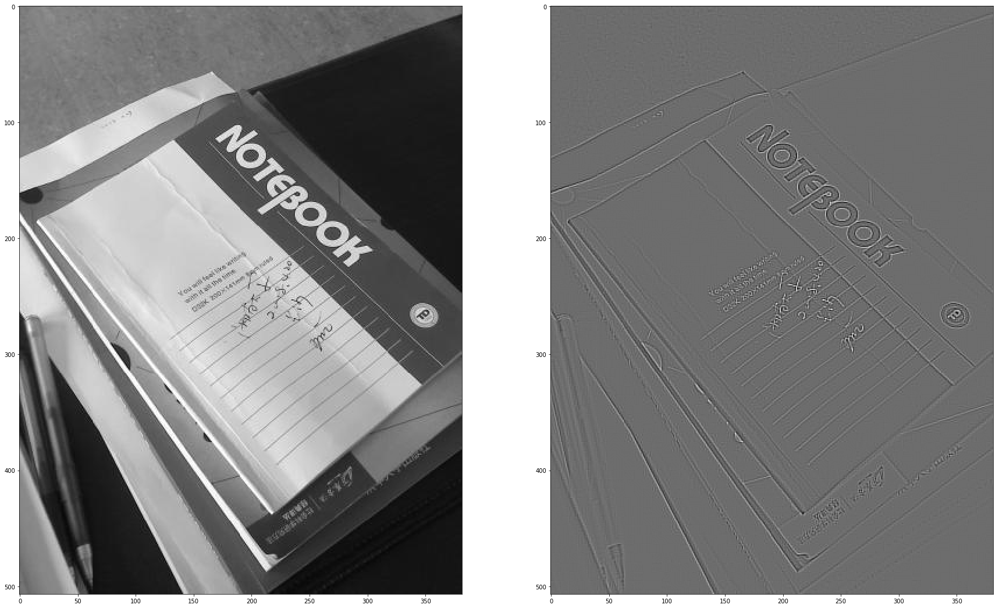

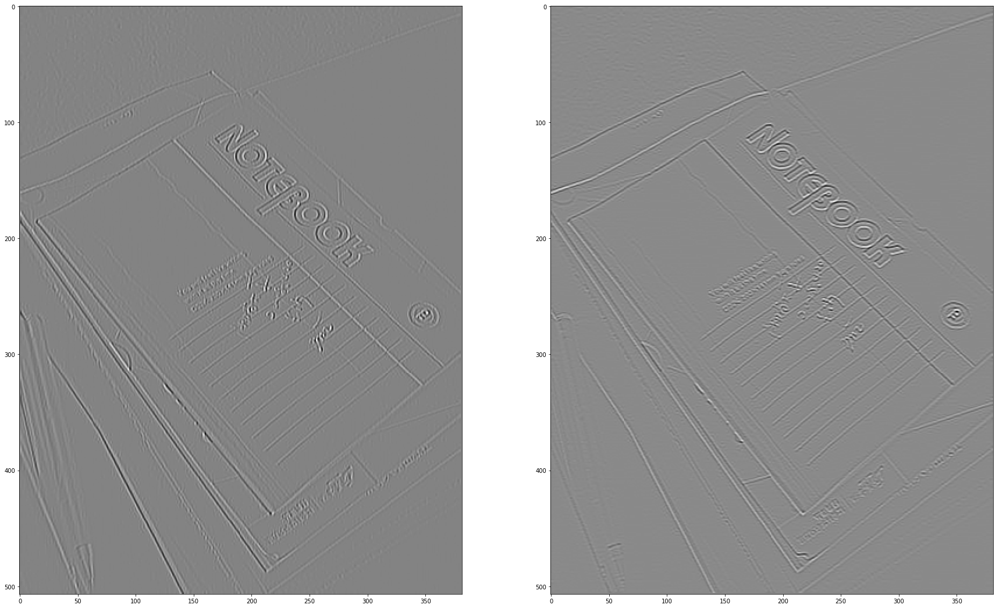

In [3]:
img_laplace = cv2.Laplacian(gray1, cv2.CV_32F, ksize=3)#pre-process the image to make the conrner point obvious  
dx=cv2.Sobel(img_laplace,-1,1,0)#calculate the gradient of image be processed along x-axis
dy=cv2.Sobel(img_laplace,-1,0,1)#calculate the gradient of image be processed along y-axis
plt.subplot(121)
plt.imshow(gray1,cmap='gray')
plt.subplot(122)
plt.imshow(img_laplace,cmap='gray')
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()
plt.subplot(121)
plt.imshow(dx,cmap='gray')
plt.subplot(122)
plt.imshow(dy,cmap='gray')
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()

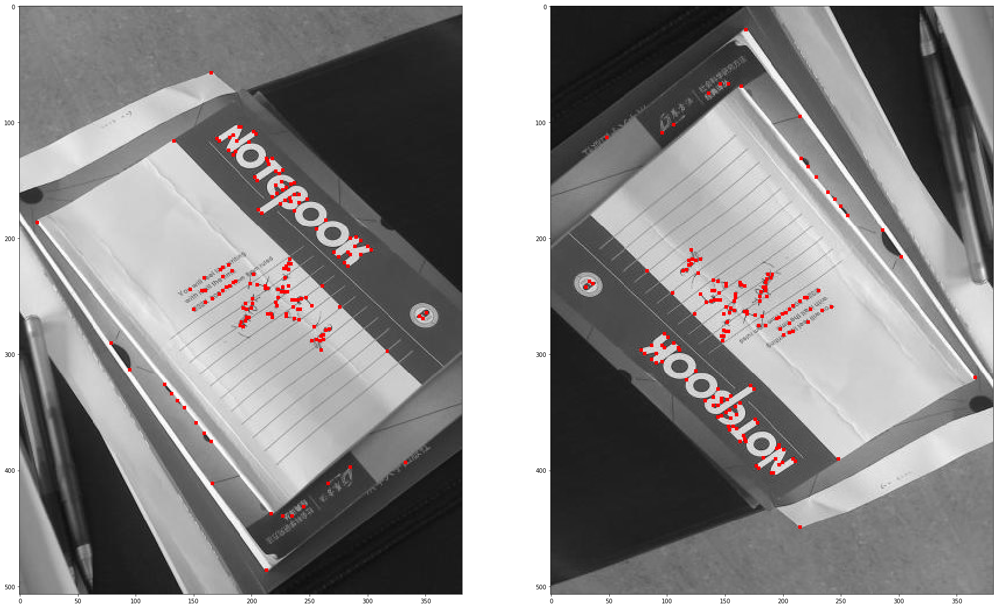

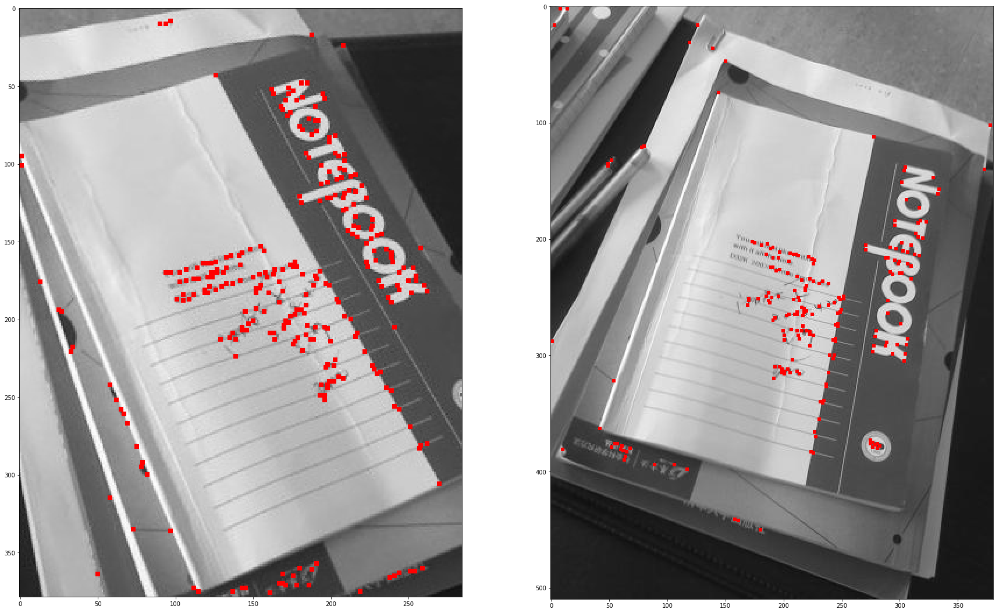

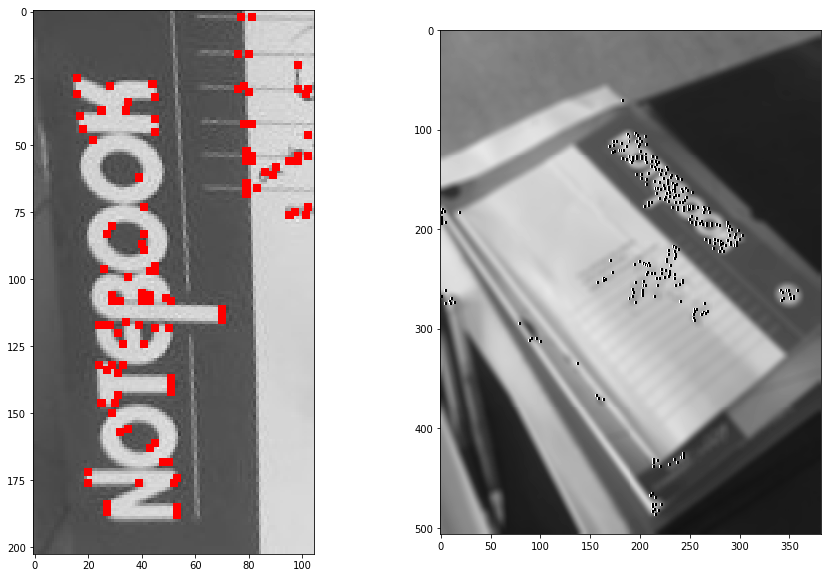

The feature points of the first image is 162 
The feature points of the second image is 165 
The feature points of the third image is 287 
The feature points of the fourth image is 214 
The feature points of the fifth image is 108 
The feature points of the last image is 300 


In [14]:
#plot the corner point of a certain image
pict1=plot_points(pic1,cp1plot)
pict2=plot_points(pic2,cp2plot)
pict3=plot_points(pic3,cp3plot)
pict4=plot_points(pic4,cp4plot)
pict5=plot_points(pic5,cp5plot)
pict6=plot_points(gray1g,cp1gplot)
plt.subplot(121)
plt.imshow(pict1)
plt.subplot(122)
plt.imshow(pict2)
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()
plt.subplot(121)
plt.imshow(pict3)
plt.subplot(122)
plt.imshow(pict4)
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()
plt.subplot(121)
plt.imshow(pict5)
plt.subplot(122)
plt.imshow(pict6,cmap='gray')
fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.show()
print("The feature points of the first image is {} ".format(len(cp1[1])))
print("The feature points of the second image is {} ".format(len(cp2[1])))
print("The feature points of the third image is {} ".format(len(cp3[1])))
print("The feature points of the fourth image is {} ".format(len(cp4[1])))
print("The feature points of the fifth image is {} ".format(len(cp5[1])))
print("The feature points of the last image is {} ".format(len(cp1g[1])))

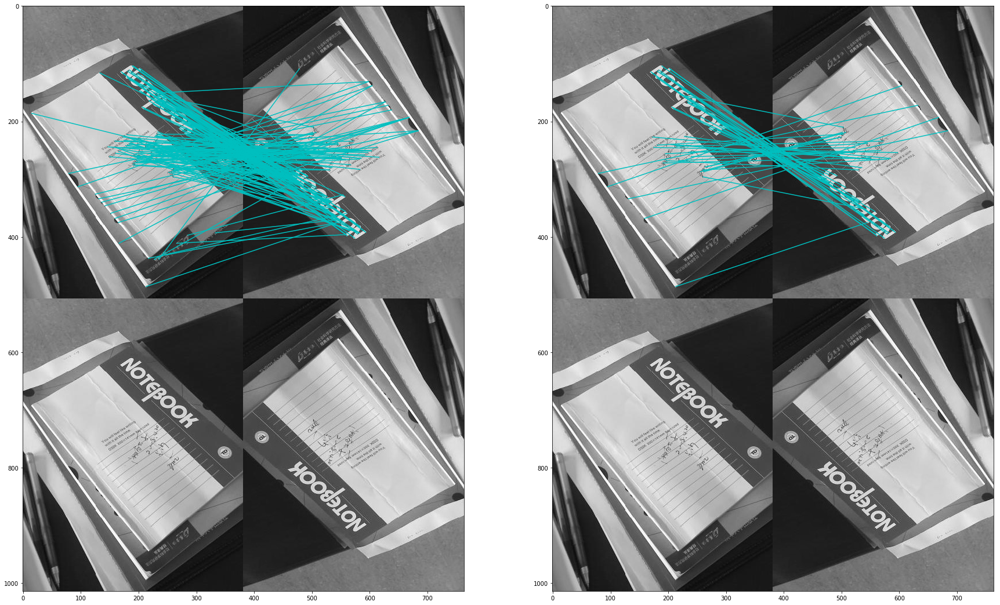

The number of one-sided matching pairs is 160 
The number of two-sided matching pairs is 52 


In [6]:
matches = match(d1, d2)#one-sided match
matches1 = match_twosided(d1, d2)#two-sided match
plt.subplot(121)
plot_matches(gray1, gray2, cp1, cp2, matches)
plt.subplot(122)
plot_matches(gray1, gray2, cp1, cp2, matches1)
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()
print("The number of one-sided matching pairs is {} ".format(len(np.where(matches>0)[0])))
print("The number of two-sided matching pairs is {} ".format(len(np.where(matches1>0)[0])))

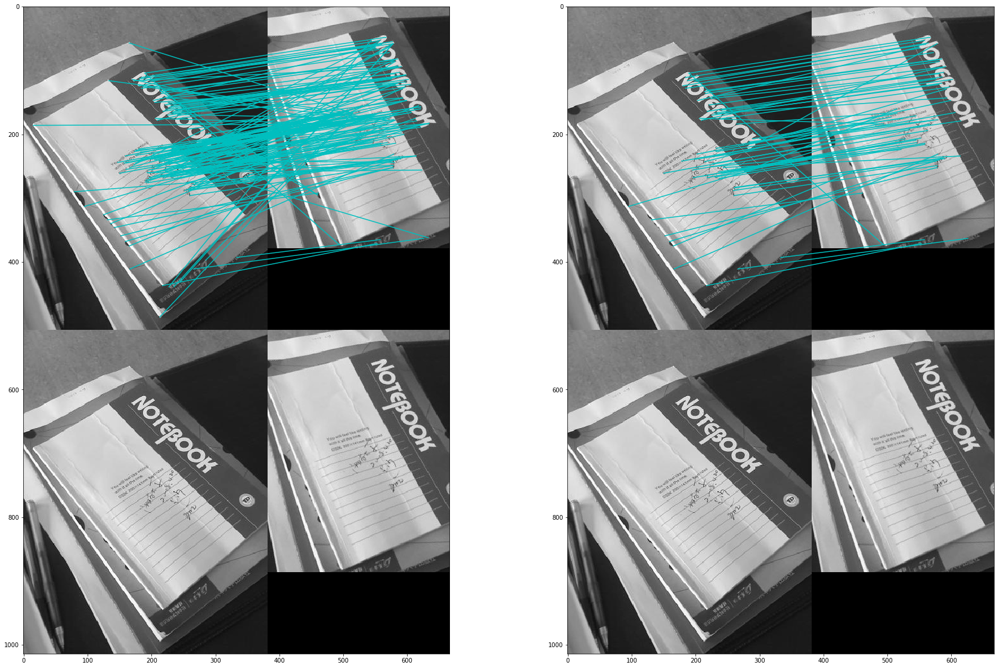

The number of one-sided matching pairs is 162 
The number of two-sided matching pairs is 64 


In [7]:
matches2 = match(d1, d3)
matches3 = match_twosided(d1, d3)
plt.subplot(121)
plot_matches(gray1, gray3, cp1, cp3, matches2)
plt.subplot(122)
plot_matches(gray1, gray3, cp1, cp3, matches3)
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()
print("The number of one-sided matching pairs is {} ".format(len(np.where(matches2>0)[0])))
print("The number of two-sided matching pairs is {} ".format(len(np.where(matches3>0)[0])))

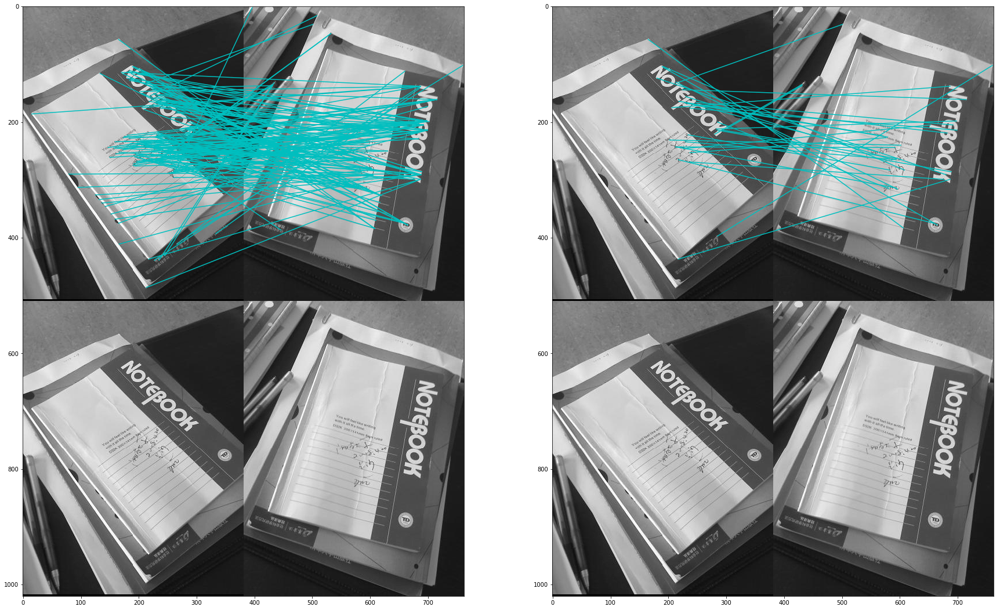

The number of one-sided matching pairs is 162 
The number of two-sided matching pairs is 32 


In [8]:
matches4 = match(d1, d4)
matches5 = match_twosided(d1, d4)
plt.subplot(121)
plot_matches(gray1, gray4, cp1, cp4, matches4)
plt.subplot(122)
plot_matches(gray1, gray4, cp1, cp4, matches5)
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()
print("The number of one-sided matching pairs is {} ".format(len(np.where(matches4>0)[0])))
print("The number of two-sided matching pairs is {} ".format(len(np.where(matches5>0)[0])))

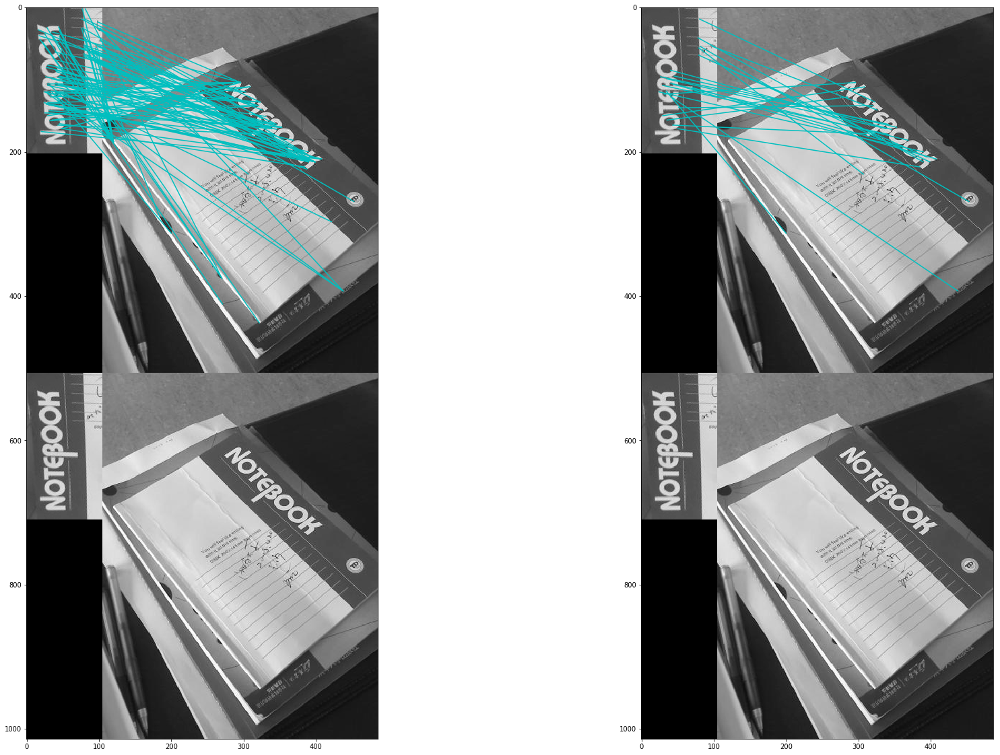

In [51]:
matches6 = match(d5, d1)
matches7 = match_twosided(d5, d1)
plt.subplot(121)
plot_matches(gray5, gray1, cp5, cp1, matches6)
plt.subplot(122)
plot_matches(gray5, gray1, cp5, cp1, matches7)
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()

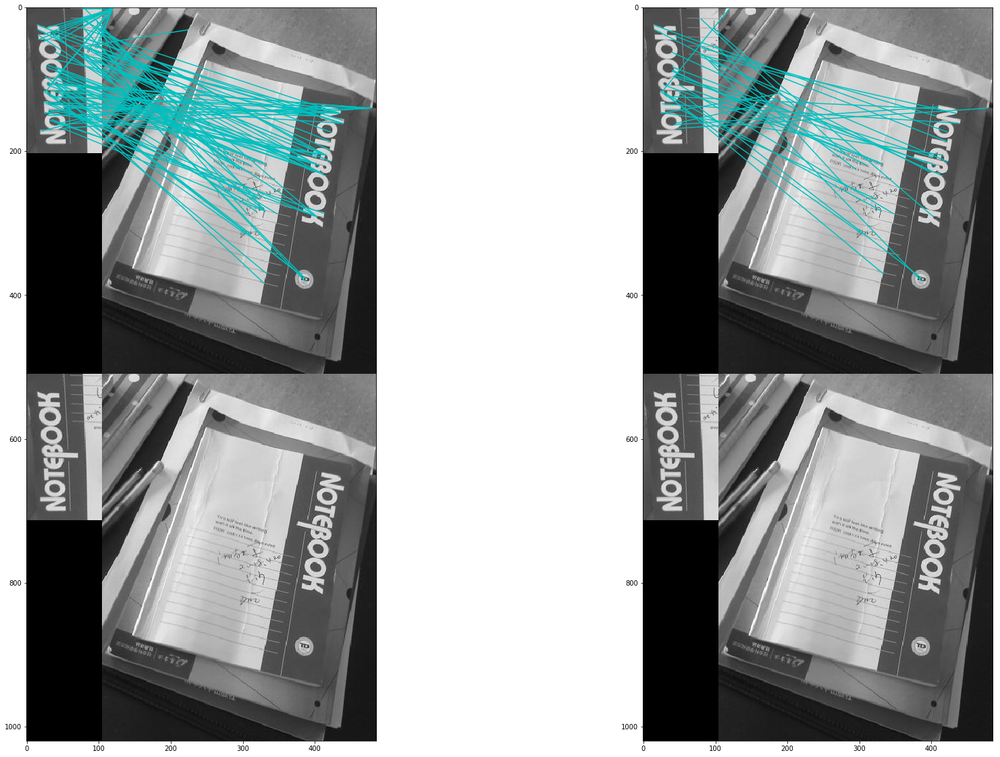

In [54]:
matches8 = match(d5, d4)
matches9 = match_twosided(d5, d4)
plt.subplot(121)
plot_matches(gray5, gray4, cp5, cp4, matches8)
plt.subplot(122)
plot_matches(gray5, gray4, cp5, cp4, matches9)
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()

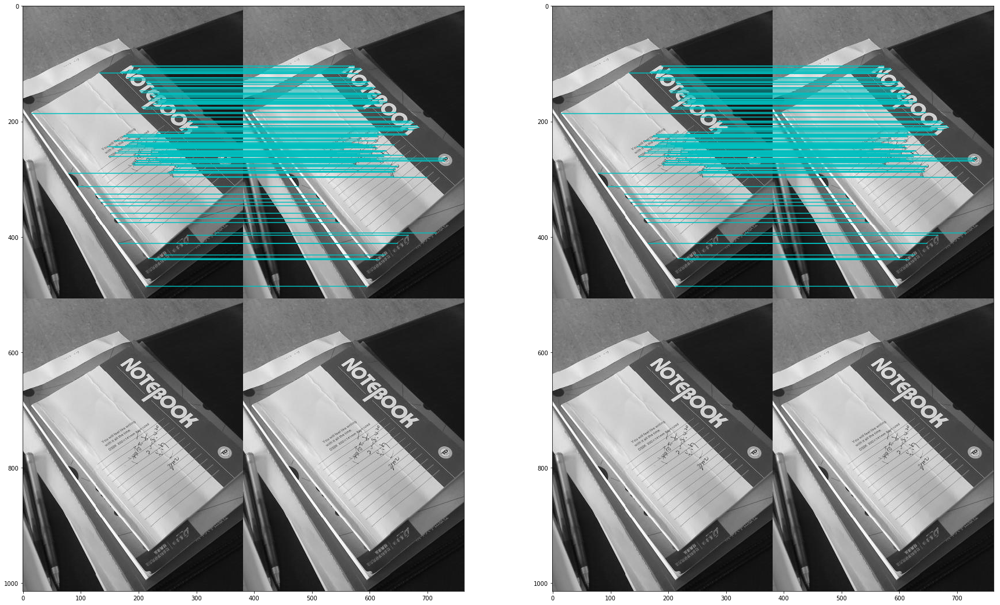

The number of one-sided matching pairs is 161 
The number of two-sided matching pairs is 161 


In [9]:
matches10 = match(d1, d1)
matches11 = match_twosided(d1, d1)
plt.subplot(121)
plot_matches(gray1, gray1, cp1, cp1, matches10)
plt.subplot(122)
plot_matches(gray1, gray1, cp1, cp1, matches11)
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()
print("The number of one-sided matching pairs is {} ".format(len(np.where(matches10>0)[0])))
print("The number of two-sided matching pairs is {} ".format(len(np.where(matches11>0)[0])))

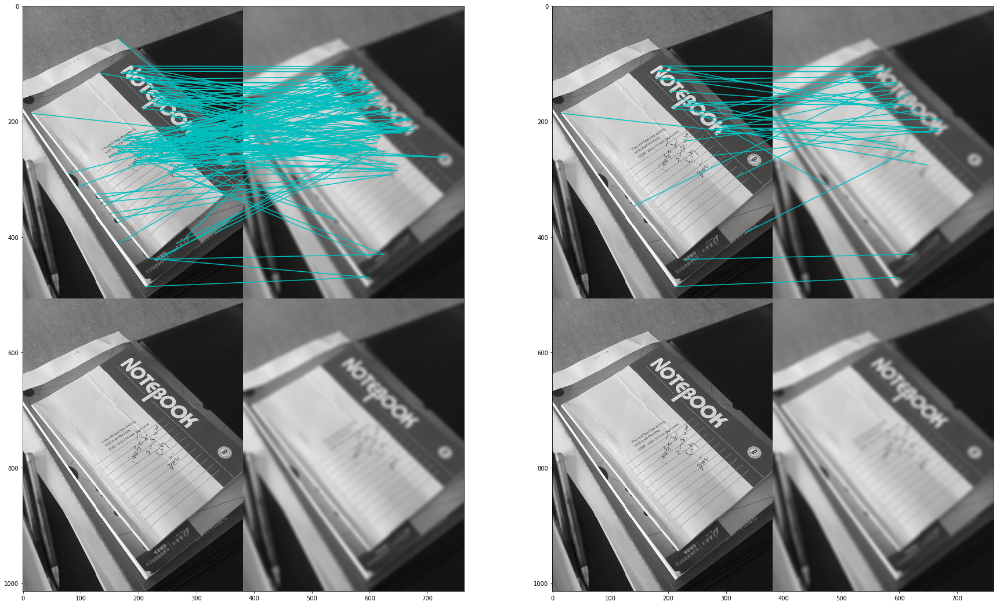

The number of one-sided matching pairs is 160 
The number of two-sided matching pairs is 32 


In [10]:
matches12 = match(d1, d1g)
matches13 = match_twosided(d1, d1g)
plt.subplot(121)
plot_matches(gray1, gray1g, cp1, cp1g, matches12)
plt.subplot(122)
plot_matches(gray1, gray1g, cp1, cp1g, matches13)
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()
print("The number of one-sided matching pairs is {} ".format(len(np.where(matches12>0)[0])))
print("The number of two-sided matching pairs is {} ".format(len(np.where(matches13>0)[0])))

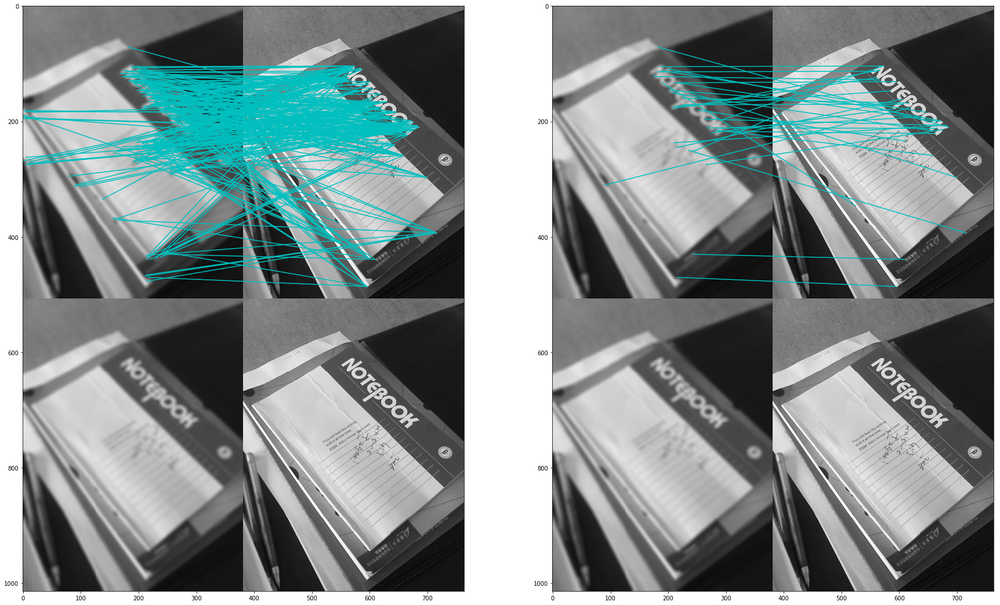

The number of one-sided matching pairs is 283 
The number of two-sided matching pairs is 33 


In [11]:
matches12 = match(d1g, d1)
matches13 = match_twosided(d1g, d1)
plt.subplot(121)
plot_matches(gray1g, gray1, cp1g, cp1, matches12)
plt.subplot(122)
plot_matches(gray1g, gray1, cp1g, cp1, matches13)
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()
print("The number of one-sided matching pairs is {} ".format(len(np.where(matches12>0)[0])))
print("The number of two-sided matching pairs is {} ".format(len(np.where(matches13>0)[0])))

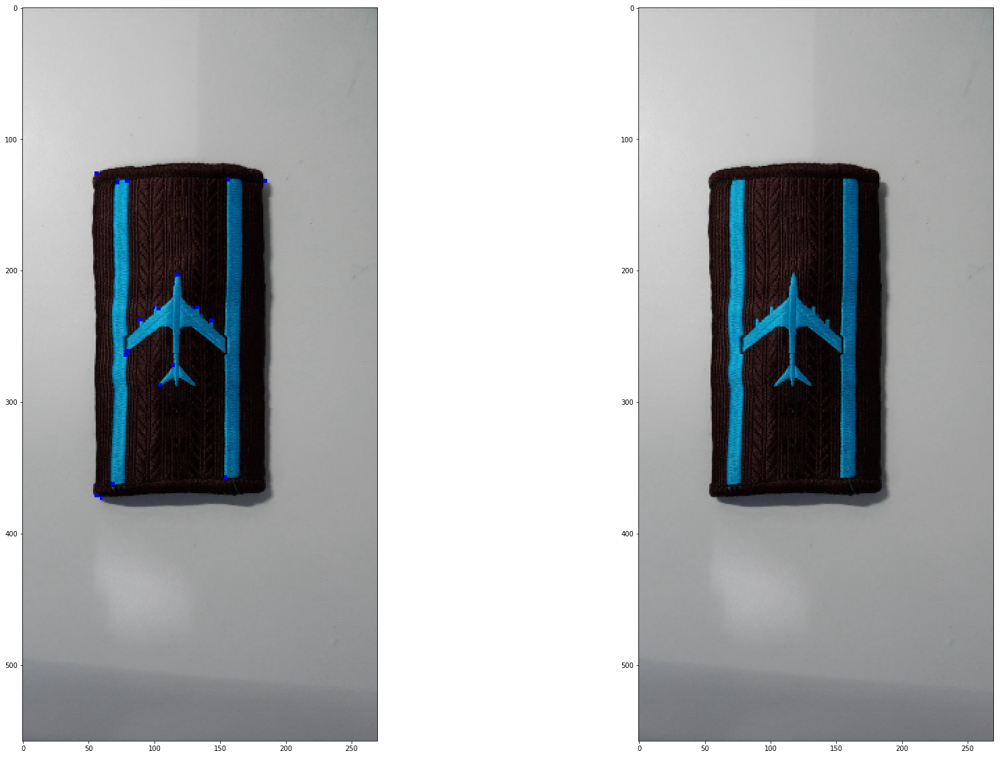

In [4]:
import cv2
import copy
import numpy as np
import matplotlib
import math
from matplotlib import pyplot as plt  

filename = 'imdata\\t1.jpg'
tu = cv2.imread(filename)
tu = cv2.resize(tu,(int(tu.shape[1]*0.25), int(tu.shape[0]*0.25)))
tu1=tu.copy()
gray = cv2.cvtColor(tu, cv2.COLOR_RGB2GRAY)
gray = np.float32(gray)

img_laplace = cv2.Laplacian(gray, cv2.CV_32F, ksize=3)  

dx=cv2.Sobel(gray,-1,1,0)
dy=cv2.Sobel(gray,-1,0,1)
A = dx * dx
B = dy * dy 
C = dx * dy


A1 = A
B1 = B
C1 = C

A1 = cv2.GaussianBlur(A1,(3,3),1.5)
B1 = cv2.GaussianBlur(B1,(3,3),1.5)
C1 = cv2.GaussianBlur(C1,(3,3),1.5)

a = int(gray.shape[0])
b = int(gray.shape[1])

R = np.zeros(gray.shape)
R1 = np.zeros(gray.shape)
record= np.zeros(gray.shape)
for i in range(a):
    for j in range(b):
        M = [[A1[i,j],C1[i,j]],[C1[i,j],B1[i,j]]]

        R[i,j] = np.linalg.det(M) - 0.06 * (np.trace(M)) * (np.trace(M))
        R1[i,j] = np.linalg.det(M) - 0.04 * (np.trace(M)) * (np.trace(M))
R_max=np.max(R)
R = cv2.dilate(R,None)
for i in range(1,a-1):
    for j in range(1,b-1):
        if R[i,j]>=0.3*R_max and R[i,j]==np.max(R[i-1:i+2, j-1:j+2]):
            tu[i,j]=[0,0,255]
        if R1[i,j]>=0.015*R_max and R1[i,j]==np.max(R[i-1:i+2, j-1:j+2]):
            tu1[i,j]=[0,0,255]
plt.subplot(121)
plt.imshow(tu,cmap='gray')
plt.subplot(122)
plt.imshow(tu1,cmap='gray')
fig = plt.gcf()
fig.set_size_inches(30, 20)
plt.show()